## Assignment 2: Time Series Forecasting

### \Zhige Zhang \a1894523

### 1. Read the dataset

In [2]:
#importing librari

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
#read the data
UseOfEnergydata = pd.read_csv('energydata_complete.csv')
UseOfEnergydata.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [3]:
#check the basic info for dataset
UseOfEnergydata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

In [4]:
# Check the basic information of the data
UseOfEnergydata.describe().T

,count,mean,std,min,25%,50%,75%,max
Appliances,19735.0,97.694958,102.524891,10.000000,50.000000,60.000000,100.000000,1080.000000
lights,19735.0,3.801875,7.935988,0.000000,0.000000,0.000000,0.000000,70.000000
T1,19735.0,21.686571,1.606066,16.790000,20.760000,21.600000,22.600000,26.260000
RH_1,19735.0,40.259739,3.979299,27.023333,37.333333,39.656667,43.066667,63.360000
T2,19735.0,20.341219,2.192974,16.100000,18.790000,20.000000,21.500000,29.856667
RH_2,19735.0,40.420420,4.069813,20.463333,37.900000,40.500000,43.260000,56.026667
T3,19735.0,22.267611,2.006111,17.200000,20.790000,22.100000,23.290000,29.236000
RH_3,19735.0,39.242500,3.254576,28.766667,36.900000,38.530000,41.760000,50.163333
T4,19735.0,20.855335,2.042884,15.100000,19.530000,20.666667,22.100000,26.200000
RH_4,19735.0,39.026904,4.341321,27.660000,35.530000,38.400000,42.156667,51.090000


### 2. Analyse and visualise the data

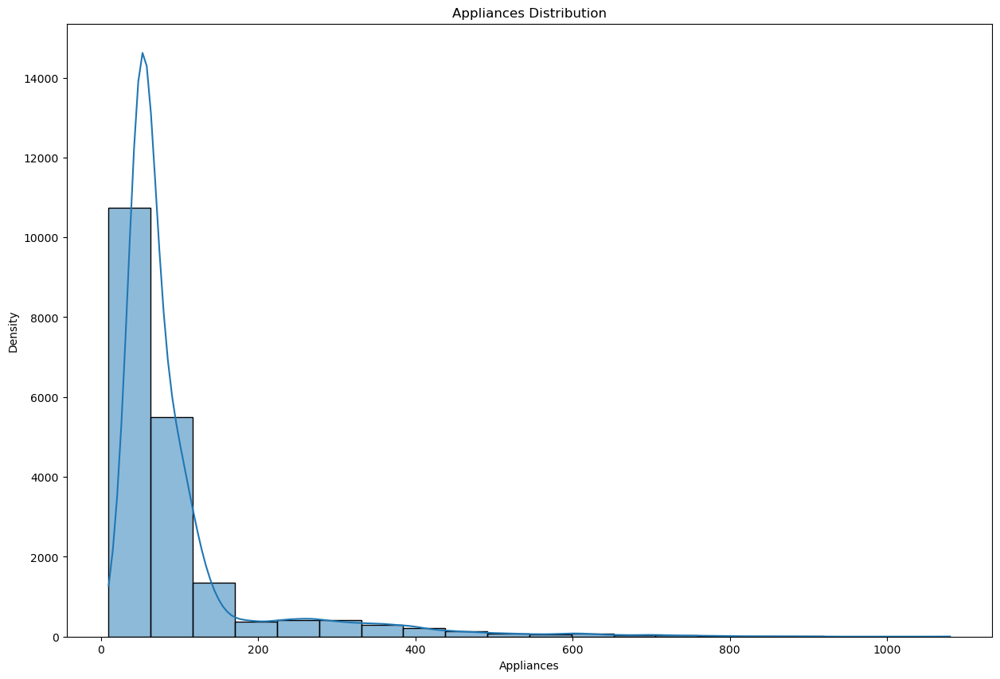

In [5]:
# data EDA

# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Histogram of NObeyesdad (Use displot to analysis)
plt.figure(figsize=(15, 10))
sns.histplot(UseOfEnergydata['Appliances'], bins=20, kde=True)
plt.title('Appliances Distribution')
plt.xlabel('Appliances')
plt.ylabel('Density')
plt.show()

*The chart reveals a positively skewed distribution of appliance usage density. The use of electrical appliances in most homes is concentrated in the lower range, particularly between 0 and 200, displaying a clear right-skewed distribution. There is a very high frequency at 0, which quickly declines as appliance usage increases and nearly levels off beyond 200.*

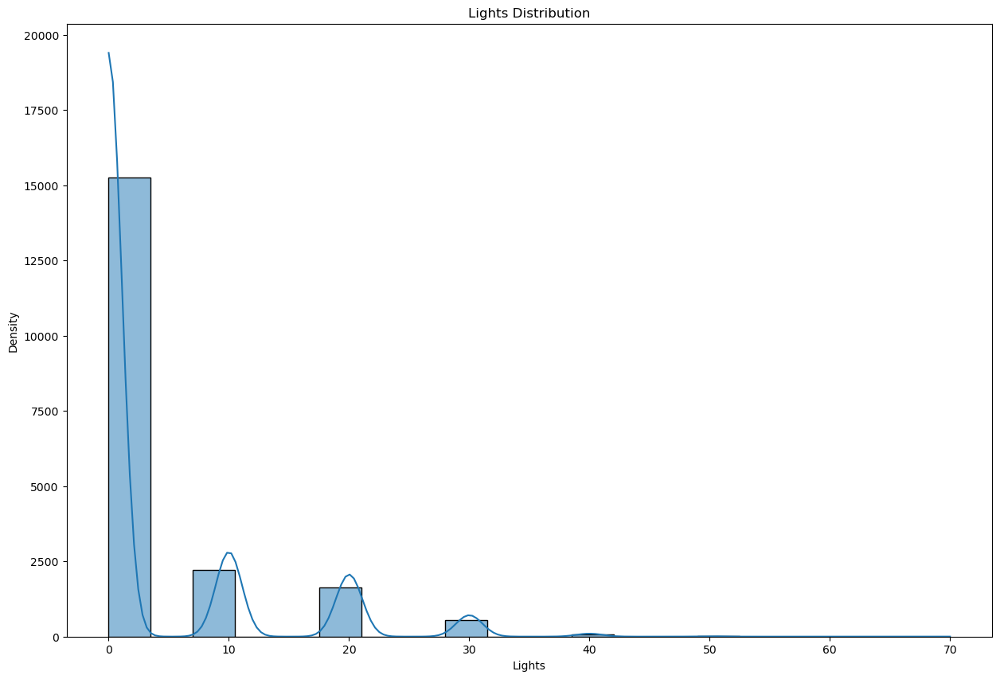

In [6]:
# data EDA

# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Histogram of NObeyesdad (Use displot to analysis)
plt.figure(figsize=(15, 10))
sns.histplot(UseOfEnergydata['lights'], bins=20, kde=True)
plt.title('Lights Distribution')
plt.xlabel('Lights')
plt.ylabel('Density')
plt.show()

*The chart displays a distribution of lighting usage concentrated heavily around very low levels (0-10), with an extremely high density at 0, along with smaller peaks at 10, 20, 30 and 50 indicating increased usage during specific times or conditions. The prominent peak at 0 suggests many households likely had no lights on for extended periods, potentially during daytime or absence, while the smaller peaks may represent typical evening or activity-based lighting patterns.*

#### These insights are crucial for developing time series models to predict residential energy consumption based on weather conditions, where high frequencies of low usage suggest off-peak or essential device use, and low frequencies at high usage indicate isolated spikes during extreme conditions.

### 2.1 Identify data dependencies

In [4]:
#converting date into datetime
UseOfEnergydata['date'] = UseOfEnergydata['date'].astype('datetime64[ns]')
UseOfEnergydata['Date'] = pd.to_datetime(UseOfEnergydata['date']).dt.date
UseOfEnergydata['Time'] = pd.to_datetime(UseOfEnergydata['date']).dt.time
UseOfEnergydata['hour'] = UseOfEnergydata['date'].dt.hour
UseOfEnergydata['month'] = UseOfEnergydata['date'].dt.month
UseOfEnergydata['NSM'] = UseOfEnergydata['date'].apply(lambda x: x.hour * 3600 + x.minute * 60 + x.second)
UseOfEnergydata['WeekStatus'] = UseOfEnergydata['date'].apply(lambda x: 1 if x.weekday() < 5 else 0)
UseOfEnergydata['DayOfWeek'] = UseOfEnergydata['date'].dt.day_name()
UseOfEnergydata= UseOfEnergydata.drop(["date"], axis=1)
UseOfEnergydata.describe().T

,count,mean,std,min,25%,50%,75%,max
Appliances,19735.0,97.694958,102.524891,10.000000,50.000000,60.000000,100.000000,1080.000000
lights,19735.0,3.801875,7.935988,0.000000,0.000000,0.000000,0.000000,70.000000
T1,19735.0,21.686571,1.606066,16.790000,20.760000,21.600000,22.600000,26.260000
RH_1,19735.0,40.259739,3.979299,27.023333,37.333333,39.656667,43.066667,63.360000
T2,19735.0,20.341219,2.192974,16.100000,18.790000,20.000000,21.500000,29.856667
RH_2,19735.0,40.420420,4.069813,20.463333,37.900000,40.500000,43.260000,56.026667
T3,19735.0,22.267611,2.006111,17.200000,20.790000,22.100000,23.290000,29.236000
RH_3,19735.0,39.242500,3.254576,28.766667,36.900000,38.530000,41.760000,50.163333
T4,19735.0,20.855335,2.042884,15.100000,19.530000,20.666667,22.100000,26.200000
RH_4,19735.0,39.026904,4.341321,27.660000,35.530000,38.400000,42.156667,51.090000


In [8]:
numerical = [var_1 for var_1 in UseOfEnergydata.columns if UseOfEnergydata[var_1].dtype=='float64']

print('There are {} numerical variables\n'.format(len(numerical)))

print('The numerical variables are :\n\n', numerical)

categorical = [var for var in UseOfEnergydata.columns if UseOfEnergydata[var].dtype=='object']

print('There are {} categorical variables\n'.format(len(categorical)))

print('The categorical variables are :\n\n', categorical)

There are 26 numerical variables

The numerical variables are :

 ['T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint', 'rv1', 'rv2']
There are 3 categorical variables

The categorical variables are :

 ['Date', 'Time', 'DayOfWeek']


### Overview of data

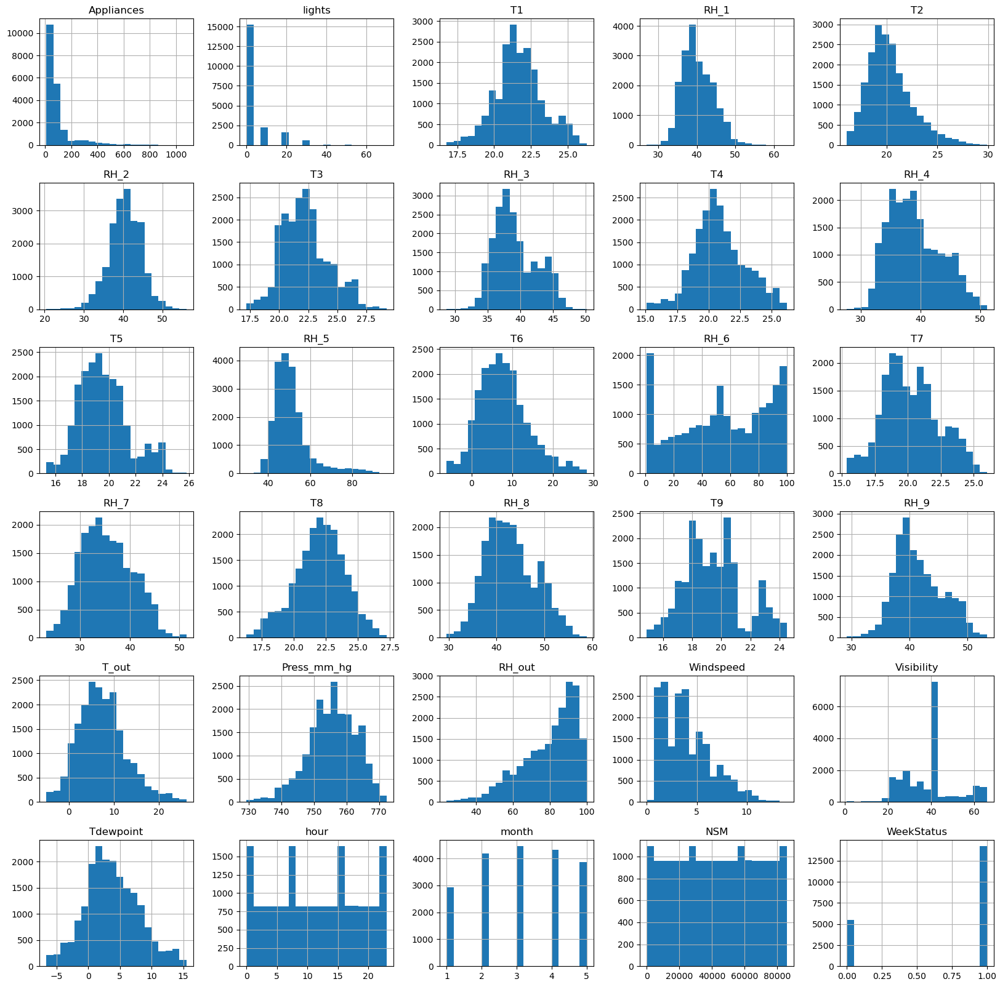

In [9]:
# drop rv1, rv2
data = UseOfEnergydata.drop(['rv1', 'rv2'], axis=1)
# print histogram
data.hist(figsize=(20,20),bins=20)
plt.show()

The dataset reveals several key characteristics:
1. Appliance usage exhibits high-energy periods, while lighting seems largely turned off most of the time.
2. Room temperatures are relatively uniform, but average temperatures differ, potentially due to room usage and heating/cooling system settings. Relative humidity distributions show some rooms (may kitchens/bathrooms) have higher humidity levels.
3. Outdoor temperature and humidity ranges are wide. Wind speeds are low, with high visibility values.
4. Data is concentrated in specific months (spring) and specific hours, indicating uneven distribution of observations.

### Numerical data analysis

#### Analysis of Appliances energy use 

/Users/vickyzhang/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


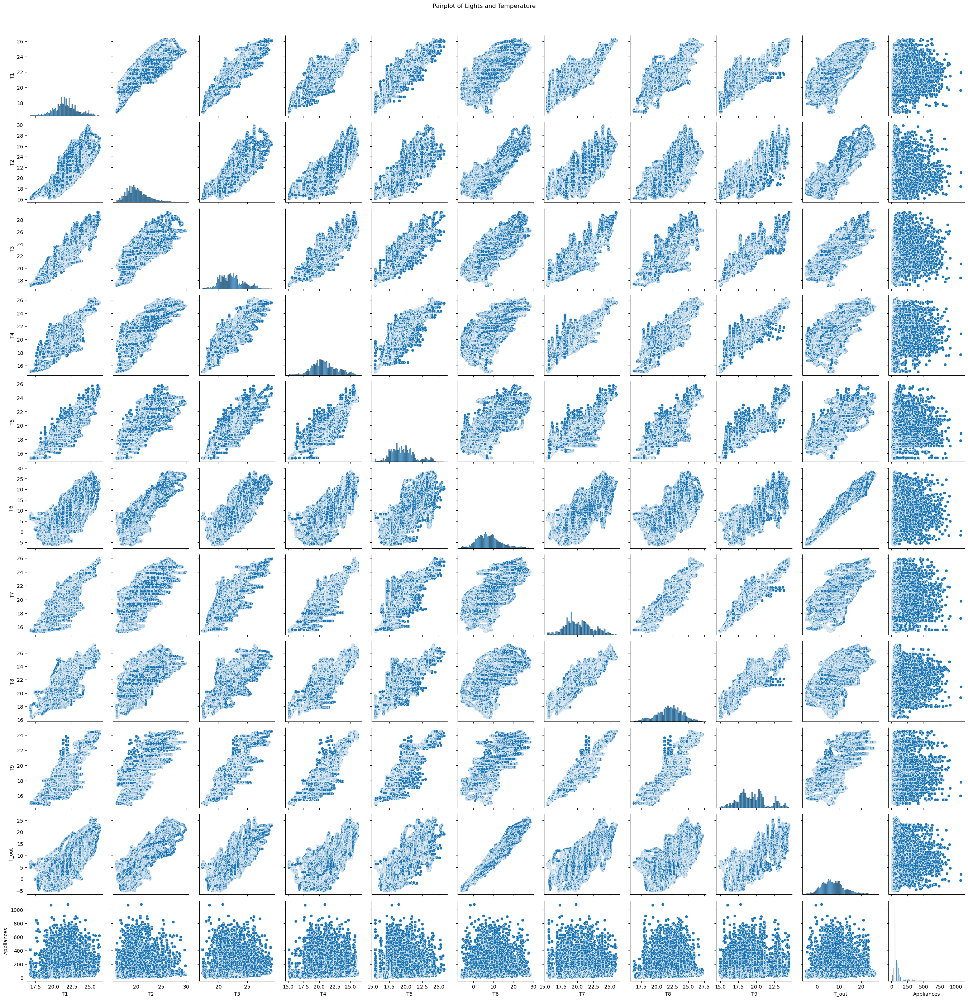

In [10]:
# Pairplot for Appliances and Temperature 
sns.pairplot(UseOfEnergydata[['T1','T2','T3','T4','T5','T6','T7','T8', 'T9', 'T_out','Appliances']]) 
plt.suptitle('Pairplot of Lights and Temperature', y=1.02) 
plt.show()

*Indoor temperatures exhibit a positive correlation with outdoor temperature and among different indoor rooms, likely influenced by a common temperature control system. Appliance usage decreases as indoor temperatures (T1 to T9) rise, suggesting reduced heating needs in warmer environments, while lower temperatures lead to higher usage due to increased heating demands. A positive correlation also exists between external temperature and appliance usage, indicating higher temperatures result in greater energy consumption by appliances.*

/Users/vickyzhang/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


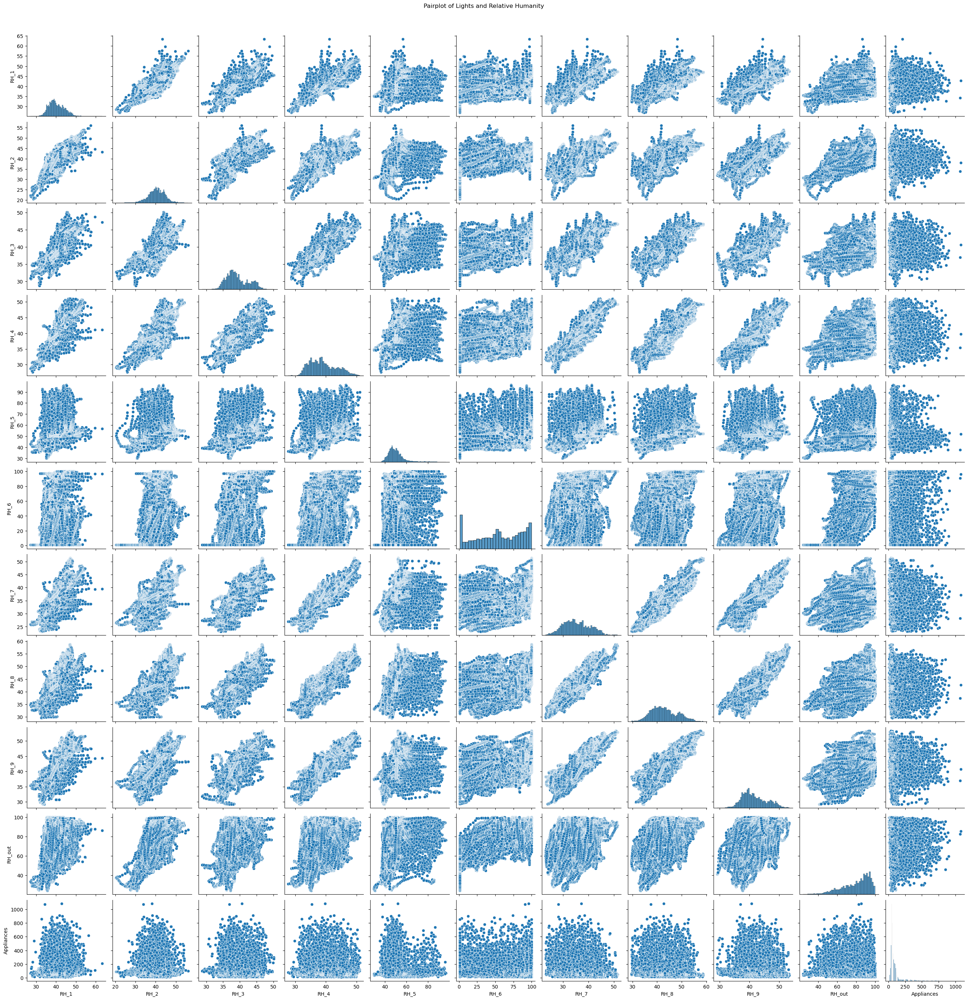

In [11]:
# Pairplot for Appliances and Relative Humanity
sns.pairplot(UseOfEnergydata[['RH_1', 'RH_2', 'RH_3', 'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9', 'RH_out','Appliances']]) 
plt.suptitle('Pairplot of Lights and Relative Humanity', y=1.02)
plt.show()

The relationship between relative humidity and appliance usage varies from room to room. In some rooms, higher humidity seemed to correlate with higher appliance usage, possibly due to the use of dehumidifiers or air conditioners for comfort in humid environments. There was no obvious consistent trend between external humidity and appliance use, but at some points appliance use increased under high humidity conditions.

/Users/vickyzhang/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


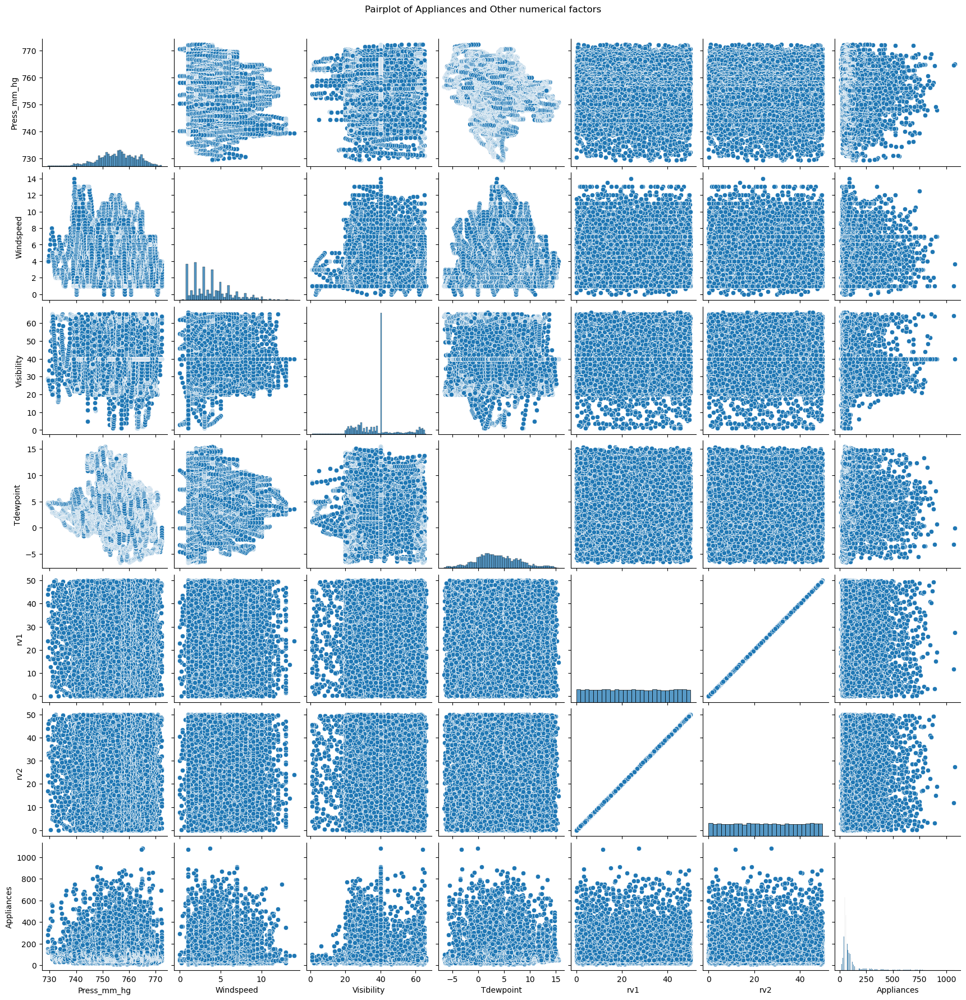

In [12]:
# Pairplot for Appliances and Other numerical factors
sns.pairplot(UseOfEnergydata[['Press_mm_hg', 'Windspeed', 'Visibility', 'Tdewpoint', 'rv1', 'rv2', 'Appliances']]) 
plt.suptitle('Pairplot of Appliances and Other numerical factors', y=1.02) 
plt.show()

*The charts illustrate the interactions between appliance energy consumption and various environmental factors (atmospheric pressure, wind speed, visibility, dew point temperature) along with two random variables (rv1 and rv2). While there is no apparent linear relationship between atmospheric pressure, visibility, and the random variables with consumption, wind speed and dew point temperature show subtle correlations. Specifically, as wind speed increases, there seems to be a slight increase in appliance usage, likely due to increased indoor ventilation needs. Additionally, higher dew point temperatures correspond to increased consumption levels, possibly due to higher utilization of dehumidifiers or air conditioning in humid conditions.*

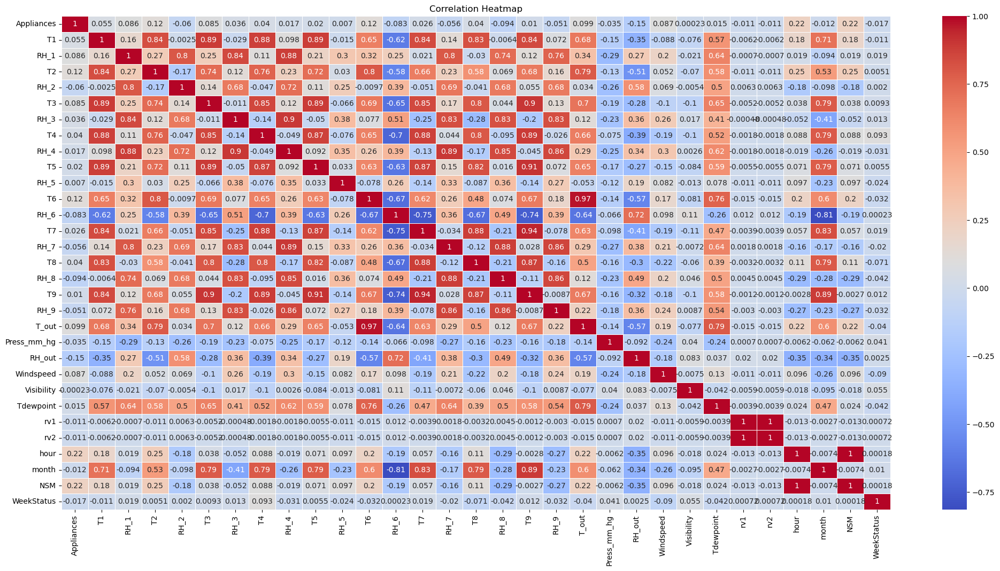

In [13]:
# Heatmap for Appliances

App_UseOfEnergydata= UseOfEnergydata.drop(["lights"], axis=1)

# Select a column of numeric type to convert the data in df to a number and delete non-numeric data
numeric_df = App_UseOfEnergydata.select_dtypes(include=[np.number])

# Matrix data
correlation_matrix = numeric_df.corr()

# Draw heatmap
plt.figure(figsize=(25, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

*The correlation heatmap reveals that appliance usage exhibits a slight increase with rising outdoor temperatures, while it decreases marginally with higher outdoor humidity and wind speeds. Indoor temperatures are mostly positively correlated with appliance usage, whereas humidity shows a negative correlation. The negative correlation with hours and positive correlation with seconds from midnight indicate decreased usage at night and increased usage during the day.*

#### Analysis of Lights energy use

/Users/vickyzhang/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


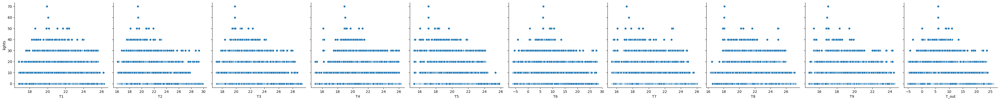

/Users/vickyzhang/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


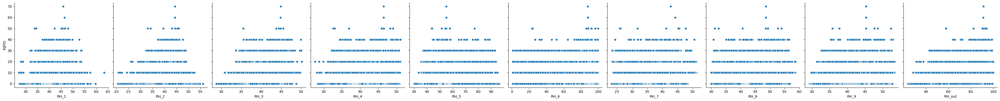

In [14]:
# Using scatter plot to T&RH with lights
def pp(a,b,c,d,e,f,g,h,i,j):
    sns.pairplot(UseOfEnergydata, x_vars=[a,b,c,d,e,f,g,h,i,j], y_vars='lights',height=4, aspect=1, kind='scatter')
    plt.show()

pp('T1','T2','T3','T4','T5','T6','T7','T8', 'T9', 'T_out')
pp('RH_1', 'RH_2', 'RH_3', 'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9', 'RH_out')

*The charts indicates that light usage in homes does not exhibit a significant correlation with internal or external temperature changes, nor with varying levels of humidity, suggesting that lighting patterns are primarily influenced by indoor activities and time periods rather than environmental conditions.*

/Users/vickyzhang/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


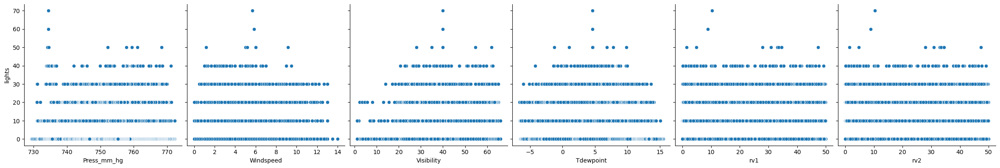

In [15]:
# Using scatter plot to Other numeric variables with lights
def pp(w,x,y,z,f,k):
    sns.pairplot(UseOfEnergydata, x_vars=[w,x,y,z,f,k], y_vars='lights',height=4, aspect=1, kind='scatter')
    plt.show()

pp('Press_mm_hg', 'Windspeed', 'Visibility', 'Tdewpoint', 'rv1', 'rv2')

*Light usage showed no significant variation across different atmospheric pressures, wind speeds, visibility levels, or dew point temperatures, indicating minimal influence of these factors on its usage. The scatter chart revealed no discernible patterns or correlations between light usage and atmospheric conditions, consistent with the random nature of these variables.*

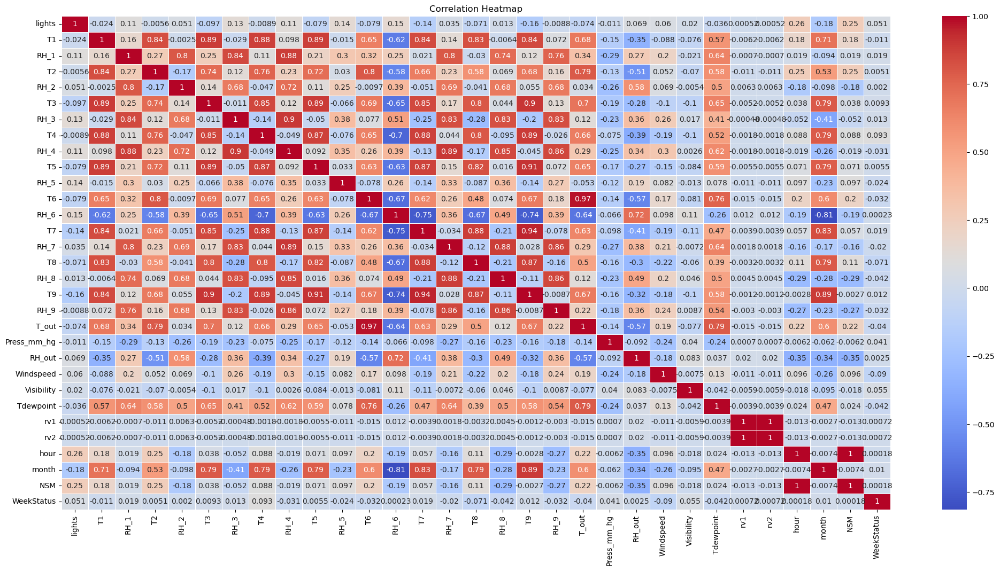

In [16]:
# Heatmap for Lights

App_UseOfEnergydata= UseOfEnergydata.drop(["Appliances"], axis=1)

# Select a column of numeric type to convert the data in df to a number and delete non-numeric data
numeric_df = App_UseOfEnergydata.select_dtypes(include=[np.number])

# Matrix data
correlation_matrix = numeric_df.corr()

# Draw heatmap
plt.figure(figsize=(25, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

*Lighting usage negatively correlates with indoor temperatures, but positively with specific high-humidity environments like bathrooms and kitchens. It exhibits negative correlations with outdoor temperatures and certain periods of the day (like daytime), likely due to lighting and temperature conditions. The correlations with outdoor humidity, wind speed, visibility and other environmental factors are insignificant. There is a negative correlation with months, indicating reduced usage during summer months.*

In [17]:
# Calculate the total energy consumed by the appliances and lights per hour
app_hour = UseOfEnergydata.groupby('hour', as_index=False)[['Appliances', 'lights']].sum()

# Add a new column for the total energy consumption of both appliances and lights
app_hour['Total Energy'] = app_hour['Appliances'] + app_hour['lights']

# Sort app_month by total energy consumption in descending order
app_hour.sort_values(by='Total Energy', ascending=False, inplace=True)

# Display the sorted DataFrame
app_hour

,hour,Appliances,lights,Total Energy
18,18,156670,6090,162760
17,17,133600,3800,137400
19,19,117600,6050,123650
11,11,109430,2940,112370
20,20,104380,7840,112220
10,10,103060,3870,106930
13,13,102540,2330,104870
12,12,101630,2640,104270
16,16,98560,2280,100840
9,9,92710,3730,96440


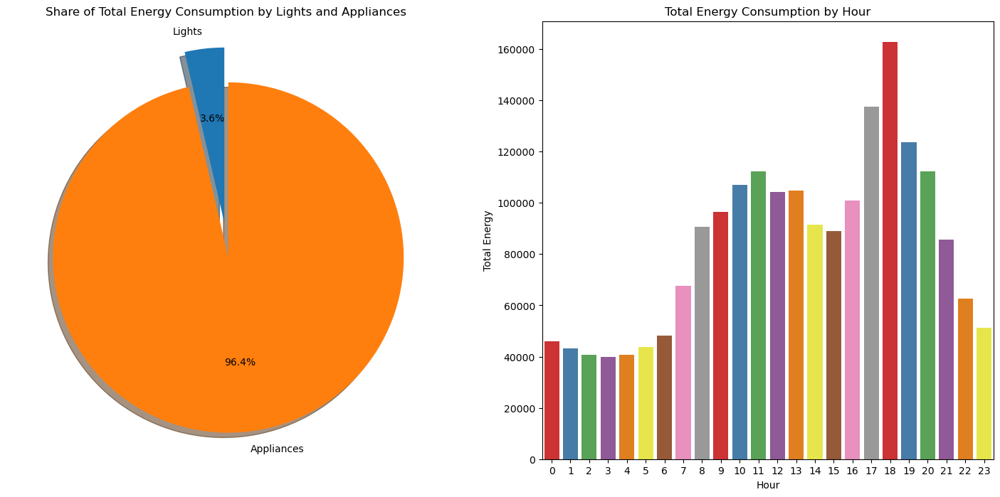

In [18]:
# Create subplots with two plots
f, ax = plt.subplots(1, 2, figsize=(18, 8))

# calculate the ligts and appliances' share
app_hour['Lights Share'] = app_hour['lights'] / app_hour['Total Energy']
app_hour['Appliances Share'] = app_hour['Appliances'] / app_hour['Total Energy']

# Pie Chart for Total Energy
shares = [app_hour['Lights Share'].sum(), app_hour['Appliances Share'].sum()]
labels = ['Lights', 'Appliances']
explode = [0.1, 0.1]  
ax[0].pie(shares, labels=labels, autopct='%1.1f%%', shadow=True, explode=explode, startangle=90)
ax[0].set_title('Share of Total Energy Consumption by Lights and Appliances')


# Bar Chart for Total Energy
sns.barplot(x='hour', y='Total Energy', data=app_hour, ax=ax[1], palette='Set1')
ax[1].set_title('Total Energy Consumption by Hour')
ax[1].set_xlabel('Hour')
ax[1].set_ylabel('Total Energy')

plt.show()

*The pie chart reveals the dominance of appliances, accounting for 96.4% of total energy consumption, while lighting accounts for only 3.6%. The bar chart depicts cyclical fluctuations in daily energy consumption, peaking at 7 pm, reaching a trough between 5-6 am, and rebounding from 6 am onwards.*

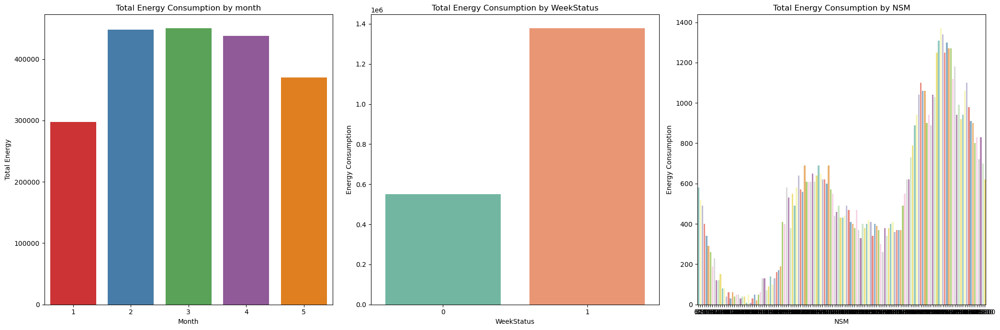

In [19]:
# Calculate the total energy consumed by the appliances and lights per month
app_month = UseOfEnergydata.groupby('month', as_index=False)[['Appliances', 'lights']].sum()
# Add a new column for the total energy consumption of both appliances and lights
app_month['Total Energy'] = app_month['Appliances'] + app_month['lights']
# Sort app_month by total energy consumption in descending order
app_month.sort_values(by='Total Energy', ascending=False, inplace=True)


# Calculate the total energy consumed by the appliances and lights per month
app_WeekStatus = UseOfEnergydata.groupby('WeekStatus', as_index=False)[['Appliances', 'lights']].sum()
# Add a new column for the total energy consumption of both appliances and lights
app_WeekStatus['Total Energy'] = app_WeekStatus['Appliances'] + app_WeekStatus['lights']
# Sort app_month by total energy consumption in descending order
app_WeekStatus.sort_values(by='Total Energy', ascending=False, inplace=True)


# Calculate the total energy consumed by the appliances and lights per month
app_NSM = UseOfEnergydata.groupby('NSM', as_index=False)[['Appliances', 'lights']].sum()
# Add a new column for the total energy consumption of both appliances and lights
app_NSM['Total Energy'] = app_NSM['Appliances'] + app_NSM['lights']
# Sort app_month by total energy consumption in descending order
app_NSM.sort_values(by='Total Energy', ascending=False, inplace=True)



# Create subplots with three plots, arranged horizontally
f, ax = plt.subplots(1, 3, figsize=(21, 7))  # Adjust figsize as needed

# Bar Chart for Total Energy Consumption by Hour
sns.barplot(x='month', y='Total Energy', data=app_month, ax=ax[0], palette='Set1')
ax[0].set_title('Total Energy Consumption by month')
ax[0].set_xlabel('Month')
ax[0].set_ylabel('Total Energy')

# Bar Chart for Appliances Energy Consumption by Hour
sns.barplot(x='WeekStatus', y='Appliances', data=app_WeekStatus, ax=ax[1], palette='Set2')
ax[1].set_title('Total Energy Consumption by WeekStatus')
ax[1].set_xlabel('WeekStatus')
ax[1].set_ylabel('Energy Consumption')

# Bar Chart for Lights Energy Consumption by Hour
sns.barplot(x='NSM', y='lights', data=app_NSM, ax=ax[2], palette='Set3')
ax[2].set_title('Total Energy Consumption by NSM')
ax[2].set_xlabel('NSM')
ax[2].set_ylabel('Energy Consumption')

# Adjust the layout so that all charts are visible and labels are not cut off
plt.tight_layout()

plt.show()

*The charts show that energy consumption peaks in March, likely due to the climate changes of the transitional season and the demand from special holidays; energy consumption significantly decreases in May, possibly due to rising temperatures reducing heating needs or effective energy-saving measures. Energy consumption on weekends far exceeds that on weekdays. Energy consumption peaks in the evening and then significantly drops during late night and early morning, likely because the evening is when household members most intensively use appliances.*

### Categorial data analysis

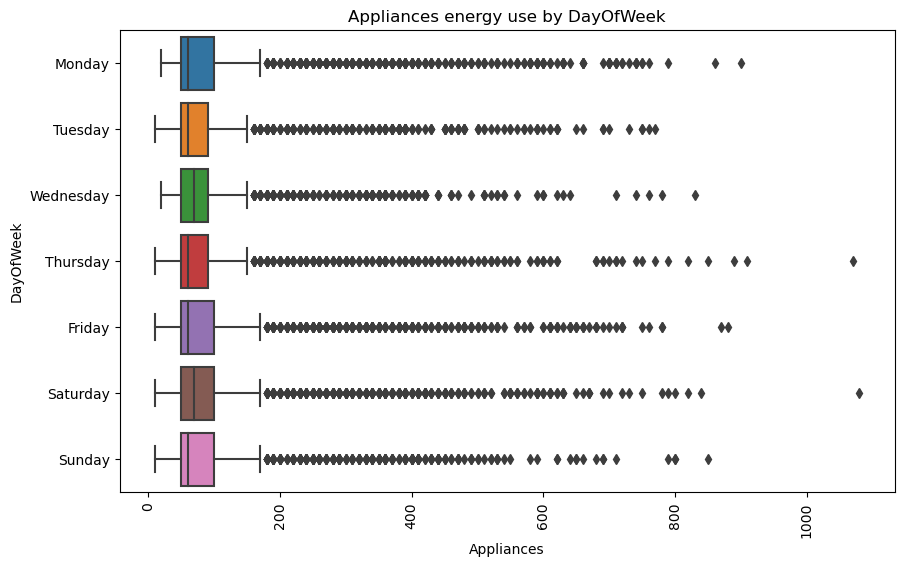

In [20]:
# Boxplot of Appliances energy use by DayOfWeek
plt.figure(figsize=(10, 6))
sns.boxplot(x='Appliances', y='DayOfWeek', data=UseOfEnergydata)
plt.title('Appliances energy use by DayOfWeek')
plt.xlabel('Appliances')
plt.ylabel('DayOfWeek')
plt.xticks(rotation=90)
plt.show()

*Appliances exhibit varying energy consumption throughout the week, with numerous outliers, especially on days like Wednesday and Friday. Appliances often have higher median energy usage than lighting, indicating more consistent demand. However, this variation and outliers are more pronounced, suggesting greater variability in how appliances are used daily or special activities requiring extensive appliance use.*

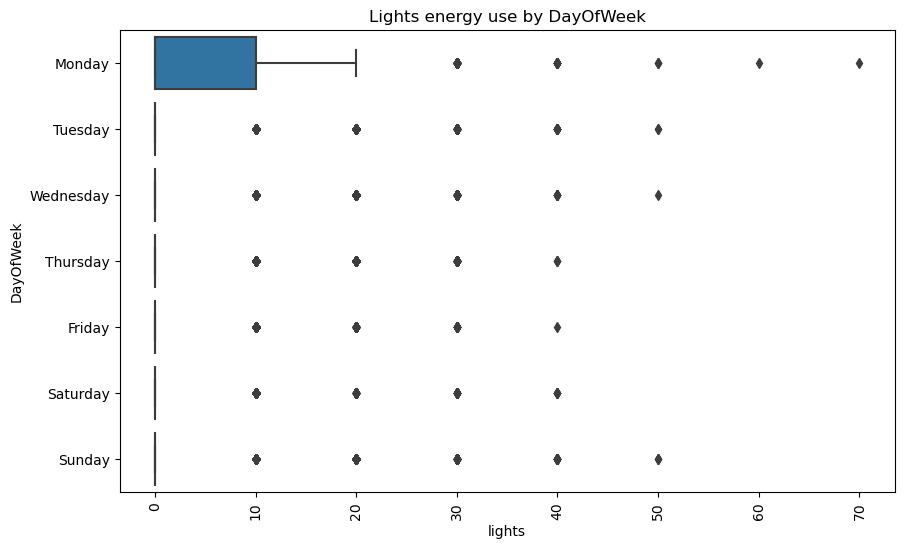

In [21]:
# Boxplot of Lights energy use by DayOfWeek
plt.figure(figsize=(10, 6))
sns.boxplot(x='lights', y='DayOfWeek', data=UseOfEnergydata)
plt.title('Lights energy use by DayOfWeek')
plt.xlabel('lights')
plt.ylabel('DayOfWeek')
plt.xticks(rotation=90)
plt.show()

*Monday is a significant outlier with light energy consumption far exceeding other days. This could indicate abnormal activity or errors in data collection. Other days show fewer outliers, suggesting more consistent usage. Median energy use remains relatively stable throughout the week, but Monday's range and outliers suggest higher variability. This could indicate recurring special events or activities on Mondays, or simply inconsistent usage patterns.*

### Observation:

**Appliance Usage:**
- Accounts for 96.4% of total energy consumption, with periodic fluctuations **peaking in evenings and weekends**.
- Decreases with increasing indoor(**T1-T9**) and outdoor(**T_out**) temperatures.  
- Positively correlated with **Tdewpoint** (possibly due to dehumidifier usage in humid conditions).
- Slight increase in **windspeed** (possibly due to increased ventilation needs).
- Significant weekly variations(**weekofstatus**) with potential outliers, particularly on Mondays.

**Lighting Usage:**
- Accounts for 3.6% of total energy consumption, with a slight decrease in summer.
- Smaller peaks at specific times/activities(**date**).
- Negative correlation with indoor temperature but positive correlation with specific high-humidity environments (bathrooms, kitchens).
- Negatively correlated with **hours** (less usage at night), positively correlated with seconds from midnight(**NSM**) (more usage during the day).

Besides, we can see that data concentrated in specific spring **months** and periods, with an uneven distribution.

**These observations provide valuable insights for selecting time series forecasting models**. 
- The daily and weekly cyclical patterns in energy usage indicate seasonality as a potential factor, while the monthly variations, with peaks in March and troughs in May, suggest an annual trend. This points towards models like ARIMA or Seasonal Naïve Method that can handle trends and seasonality in the data and account for external influences. 
- Anomalies in energy usage, particularly on Mondays, highlight potential data collection errors or special events, which can be effectively addressed by models like LSTM that can handle outliers and trends. 

### 2.2 Data Processing

Based on the above analysis, we can see that energy consumption is primarily driven by appliances and exhibits distinct seasonal and cyclical patterns, while lighting usage has almost no correlation with external environmental factors, and only shows a weak temporal correlation with hours and NSM. Additionally, factors such as date, time, Press_mm_hg and visibility have almost no correlation and can be ignored in the subsequent time series analysis. Furthermore, since DayOfWeek and weekStatus analyze similar data, we will only consider DayOfWeek for further analysis to avoid redundancy.

#### Data Encoding

In [5]:
#Encoding data for Lgistics regression

from sklearn.preprocessing import LabelEncoder

def label_encoder(a):
    le = LabelEncoder()
    return le.fit_transform(a)

UseOfEnergydata.columns

label_list = ['DayOfWeek']
for i in label_list:
    UseOfEnergydata[i] = label_encoder(UseOfEnergydata[i])

UseOfEnergydata.head()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,Tdewpoint,rv1,rv2,Date,Time,hour,month,NSM,WeekStatus,DayOfWeek
0,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,5.3,13.275433,13.275433,2016-01-11,17:00:00,17,1,61200,1,1
1,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,5.2,18.606195,18.606195,2016-01-11,17:10:00,17,1,61800,1,1
2,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,5.1,28.642668,28.642668,2016-01-11,17:20:00,17,1,62400,1,1
3,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,5.0,45.410389,45.410389,2016-01-11,17:30:00,17,1,63000,1,1
4,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,4.9,10.084097,10.084097,2016-01-11,17:40:00,17,1,63600,1,1


In [6]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

UseOfEnergydata.head()

scaler.fit(UseOfEnergydata.drop(['lights', 'Press_mm_hg','Visibility', 'Date', 'Time', 'WeekStatus'],axis=1))
scaled_features = scaler.transform(UseOfEnergydata.drop(['lights', 'Press_mm_hg','Visibility', 'Date', 'Time', 'WeekStatus'],axis=1))

UseOfEnergydata.columns

columns=['T1', 'RH_1', 'T2', 'RH_2', 'T3','RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8','RH_8', 'T9', 'RH_9', 'T_out', 'RH_out', 'Windspeed', 'Tdewpoint',
        'hour', 'month', 'NSM', 'DayOfWeek', 'rv1', 'rv2','Appliances']

UseOfEnergydata_scaled = pd.DataFrame(scaled_features,columns=columns)
UseOfEnergydata_scaled.head()

,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,...,RH_out,Windspeed,Tdewpoint,hour,month,NSM,DayOfWeek,rv1,rv2,Appliances
0,-0.367676,-1.118645,1.843821,-0.520411,1.073683,-1.235063,1.686130,-0.908217,1.506438,-1.314903,...,-0.152647,0.82208,1.207694,0.366975,-0.807974,-0.807974,0.794304,-1.569369,0.733493,-1.006248
1,-0.367676,-1.118645,1.616807,-0.520411,1.057097,-1.235063,1.704566,-0.908217,1.604528,-1.314903,...,-0.174588,0.82208,1.071703,0.343135,-0.440240,-0.440240,0.794304,-1.569369,0.757551,-1.006248
2,-0.465215,-1.118645,1.517959,-0.520411,1.033550,-1.235063,1.748608,-0.944115,1.580918,-1.314903,...,-0.196529,0.82208,0.935713,0.319294,0.252109,0.252109,0.794304,-1.569369,0.781610,-1.006248
3,-0.465215,-1.118645,1.459321,-0.520411,1.024540,-1.235063,1.769092,-0.962063,1.542526,-1.314903,...,-0.218470,0.82208,0.799723,0.295454,1.408801,1.408801,0.794304,-1.569369,0.805668,-1.006248
4,-0.367676,-1.118645,1.526336,-0.520411,1.009797,-1.235063,1.769092,-0.962063,1.497991,-1.296832,...,-0.240411,0.82208,0.663733,0.271613,-1.028122,-1.028122,0.794304,-1.569369,0.829726,-1.006248


In [7]:
# cahange the index into Date to facilitate models to train
UseOfEnergydata['Date'] = pd.to_datetime(UseOfEnergydata['Date'])
UseOfEnergydata_scaled.index = UseOfEnergydata['Date']
UseOfEnergydata_scaled

,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,...,RH_out,Windspeed,Tdewpoint,hour,month,NSM,DayOfWeek,rv1,rv2,Appliances
Date,,,,,,,,,,,,,,,,,,,,,
2016-01-11,-0.367676,-1.118645,1.843821,-0.520411,1.073683,-1.235063,1.686130,-0.908217,1.506438,-1.314903,...,-0.152647,0.822080,1.207694,0.366975,-0.807974,-0.807974,0.794304,-1.569369,0.733493,-1.006248
2016-01-11,-0.367676,-1.118645,1.616807,-0.520411,1.057097,-1.235063,1.704566,-0.908217,1.604528,-1.314903,...,-0.174588,0.822080,1.071703,0.343135,-0.440240,-0.440240,0.794304,-1.569369,0.757551,-1.006248
2016-01-11,-0.465215,-1.118645,1.517959,-0.520411,1.033550,-1.235063,1.748608,-0.944115,1.580918,-1.314903,...,-0.196529,0.822080,0.935713,0.319294,0.252109,0.252109,0.794304,-1.569369,0.781610,-1.006248
2016-01-11,-0.465215,-1.118645,1.459321,-0.520411,1.024540,-1.235063,1.769092,-0.962063,1.542526,-1.314903,...,-0.218470,0.822080,0.799723,0.295454,1.408801,1.408801,0.794304,-1.569369,0.805668,-1.006248
2016-01-11,-0.367676,-1.118645,1.526336,-0.520411,1.009797,-1.235063,1.769092,-0.962063,1.497991,-1.296832,...,-0.240411,0.822080,0.663733,0.271613,-1.028122,-1.028122,0.794304,-1.569369,0.829726,-1.006248
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-05-27,0.022483,2.415962,1.583299,2.530318,0.394449,2.458745,0.590209,1.882026,1.511812,1.955947,...,2.881489,-1.616282,-0.288198,2.282163,1.249203,1.249203,0.794304,1.417563,0.781610,-1.503663
2016-05-27,-0.075056,2.374452,1.568221,2.468301,0.407788,2.425512,0.608646,1.882026,1.511812,1.972211,...,2.856414,-1.593912,-0.220203,2.274216,1.675942,1.675942,0.794304,1.417563,0.805668,-1.503663
2016-05-27,1.680659,2.374452,1.592514,2.411103,0.576982,2.383971,0.752037,1.882026,1.544061,1.972211,...,2.831338,-1.571542,-0.152208,2.266269,0.290494,0.290494,0.794304,1.417563,0.829726,-1.503663


#### Feature selection

In [8]:
# PCA as noise filtering
from sklearn.decomposition import PCA

pca = PCA(n_components=0.90)
pca_features = pca.fit_transform(UseOfEnergydata_scaled)
print("Number of components:", pca.n_components_)

Number of components: 9


<Figure size 640x480 with 0 Axes>

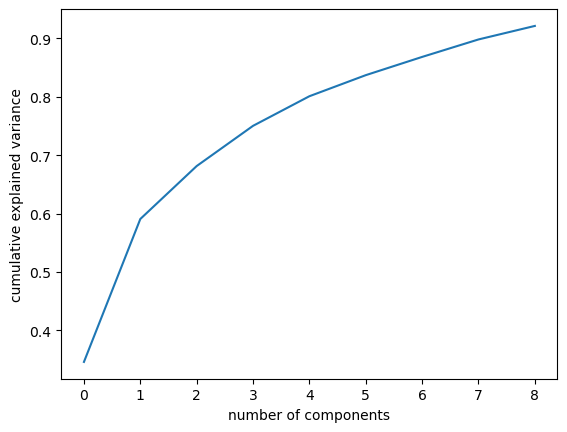

<Figure size 640x480 with 0 Axes>

In [9]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.figure()

*By setting PCA to retain 90% of the data variance, it can be observed from the graph that the cumulative explained variance starts to plateau after approximately 3 principal components. However, at least 10 principal components are required to achieve 95% of the explained variance. Therefore, in this case, the data will be compressed into 10 principal components to reduce the dimensionality of the dataset and potentially remove noise, as the low-variance components, which typically contain more noise, are excluded.*

In [10]:
# loadings to see each component correlation
loadings = pca.components_.T

loadings_df = pd.DataFrame(loadings, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7','PC8', 'PC9'], index=UseOfEnergydata_scaled.columns)
loadings_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
T1,0.026614,-0.010304,0.221844,-0.012575,0.043242,0.458846,0.702618,0.455834,-0.038201
RH_1,0.287930,0.033049,-0.014924,-0.002795,0.121886,0.013472,-0.090242,0.108883,-0.017475
T2,0.044927,0.336899,0.080745,-0.009685,0.085128,0.008119,0.152212,-0.083839,0.021830
RH_2,0.262648,0.063118,0.158330,-0.012553,-0.074936,-0.082479,-0.103470,0.193670,-0.301105
T3,-0.016454,0.301146,-0.137139,0.005906,0.212846,0.085444,0.163994,-0.252055,0.314342
RH_3,0.289337,0.056564,-0.095185,0.005352,0.058642,0.089100,0.034585,0.031531,0.064712
T4,-0.046417,0.342833,0.101824,-0.008409,0.031801,-0.057379,0.043028,0.080007,-0.117113
RH_4,0.289499,-0.006885,-0.081155,0.000383,0.088386,-0.079190,0.010180,0.103332,-0.057191
T5,0.003570,0.358945,0.105753,-0.008676,-0.001322,-0.013688,0.005980,-0.037607,-0.046394
RH_5,0.286482,0.041517,-0.103176,0.005195,0.151581,-0.001155,-0.054630,0.092549,0.096813


*PC1 captures the largest variation in the data, with higher humidity in areas like the kitchen, office, and laundry room positively correlated with energy consumption or performance indicators, while lower temperatures in areas like the ironing room, office, and parents' room are inversely correlated with PC1.  PC2 shows a strong correlation with indoor temperatures, as office, bathroom, and outdoor temperatures have significant positive loadings, while a random variable has a significant negative loading.*

*Furthermore, appliances consumption has a high negative loading on PC6; kitchen and living room humidity contribute significantly to PC1; living room temperature and outdoor temperature contribute substantially to PC2; wind speed has a large negative loading on PC3; and dew point temperature has a very high loading on PC9.*

In [11]:
pca_features = pca.fit_transform(UseOfEnergydata_scaled)
# restructure the data
original_index = UseOfEnergydata_scaled.index
reconstructed_data = pca.inverse_transform(pca_features)
UseOfEnergydata_denoised = pd.DataFrame(reconstructed_data, columns=columns, index=original_index)

# adjust index and date column
UseOfEnergydata_denoised.reset_index(inplace=True)
UseOfEnergydata_denoised.rename(columns={'index': 'Date'}, inplace=True)
UseOfEnergydata_denoised

,Date,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,RH_out,Windspeed,Tdewpoint,hour,month,NSM,DayOfWeek,rv1,rv2,Appliances
0,2016-01-11,-0.298002,-1.032096,1.275964,-0.540421,1.077428,-1.043202,1.531729,-1.416169,1.601653,...,-0.028737,0.663230,1.156911,0.493836,-0.806740,-0.806740,0.807654,-1.531850,0.807816,-0.880575
1,2016-01-11,-0.314987,-1.024827,1.244916,-0.519544,1.029641,-1.052729,1.519041,-1.403758,1.576599,...,-0.054199,0.672562,1.029289,0.464073,-0.439178,-0.439178,0.807774,-1.535981,0.807859,-0.891370
2,2016-01-11,-0.411392,-1.025878,1.204506,-0.511218,0.983931,-1.074441,1.495543,-1.398634,1.546603,...,-0.081742,0.688546,0.903283,0.436759,0.252909,0.252909,0.819078,-1.538370,0.818991,-0.893195
3,2016-01-11,-0.413081,-1.028495,1.178454,-0.499563,0.941203,-1.092344,1.484298,-1.393855,1.522783,...,-0.113310,0.705727,0.780171,0.405824,1.409318,1.409318,0.831980,-1.550071,0.831661,-0.895830
4,2016-01-11,-0.310084,-1.024850,1.185607,-0.494247,0.942124,-1.084977,1.492563,-1.387304,1.515902,...,-0.134869,0.724195,0.643928,0.390914,-1.027553,-1.027553,0.844388,-1.546530,0.844636,-0.891808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,2016-05-27,0.019658,2.345112,1.441032,2.829245,0.250573,2.251395,0.957166,2.023451,1.468733,...,2.876176,-1.234352,-0.150614,2.558867,1.247592,1.247592,0.749156,1.513201,0.748433,-1.516495
19731,2016-05-27,-0.072956,2.325994,1.425970,2.772122,0.284445,2.234460,0.931037,2.001039,1.452405,...,2.843495,-1.201410,-0.087964,2.547282,1.674374,1.674374,0.759846,1.514594,0.759007,-1.506759
19732,2016-05-27,1.634122,2.306100,1.634654,2.747085,0.396696,2.346991,1.065994,1.992142,1.487642,...,2.748265,-1.191817,-0.008245,2.454739,0.288598,0.288598,0.760476,1.433204,0.760614,-1.520503
19733,2016-05-27,3.046690,2.269005,1.770644,2.684429,0.481665,2.424527,1.136476,1.965933,1.475022,...,2.636006,-1.177393,0.067349,2.343739,-1.289651,-1.289651,0.758148,1.369117,0.759189,-1.540592


#### Imputation of missing values

In [12]:
# checking percentage of null values in each column
df_missing=pd.DataFrame((round(100*(UseOfEnergydata_denoised.isnull().sum()/len(UseOfEnergydata_denoised.index)), 2)), columns=['missing'])
df_missing.sort_values(by=['missing'], ascending=False).head(20)

,missing
Date,0.0
T1,0.0
rv2,0.0
rv1,0.0
DayOfWeek,0.0
NSM,0.0
month,0.0
hour,0.0
Tdewpoint,0.0
Windspeed,0.0


### 3. Implement prediction models

To effectively analyze energy usage data, it is crucial to choose prediction models capable of handling the inherent complexities in the dataset, such as seasonality, trends, and anomalies. Based on the observed data characteristics, two models stand out as particularly well-suited for this task: ARIMA (Autoregressive Integrated Moving Average) and LSTM (Long Short-Term Memory networks).

pip install pmdarima

pip install plotly

#### ARIMA

In [145]:
import pandas as pd
import random
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from pmdarima.arima import auto_arima


# random select data
ARIMA_data = UseOfEnergydata_denoised
ARIMA_data = ARIMA_data.iloc[:500]
# ARIMA_data = ARIMA_data.sample(n=500, random_state=42) 
# ARIMA_data = ARIMA_data.sort_values(by='Date', ascending=True)


# Split data into train and validation sets
train = ARIMA_data.iloc[:int(0.7*len(ARIMA_data)), :]
valid = ARIMA_data.iloc[int(0.7*len(ARIMA_data)):, :]

# Extract the 'Appliances' column from the training and validation sets
training = train['Appliances']
validation = valid['Appliances']

print("Training shape:", training.shape)
print("Validation shape:", validation.shape)
print("Selected data shape:", ARIMA_data.shape)

Training shape: (350,)
Validation shape: (150,)
Selected data shape: (500, 30)


#### LSTM

In [31]:
pip install torch

Note: you may need to restart the kernel to use updated packages.


In [220]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import matplotlib as mpl
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import random
from sklearn.decomposition import PCA


# add Date as index
LSTM_data = pd.DataFrame(UseOfEnergydata['Appliances'].values, index=UseOfEnergydata['Date'], columns=['Appliances'])

# Perform PCA
pca = PCA(n_components=0.75)
pca_features = pca.fit_transform(LSTM_data)
LSTM_data = pca.inverse_transform(pca_features)
LSTM_data = pd.DataFrame(LSTM_data, index=UseOfEnergydata['Date'], columns=['Appliances'])


# random select data
LSTM_data = LSTM_data.sample(n=300, random_state=42) 
LSTM_data = LSTM_data.sort_index(ascending=True)
LSTM_data.index = pd.to_datetime(LSTM_data.index)


def train_test(df, test_periods):
    """
    Split the dataset into training and testing sets
    """
    train = df[:-test_periods].values
    test = df[-test_periods:].values
    return train, test


test_periods = 8
train, test = train_test(LSTM_data, test_periods)

# Scale the training data
scaler = MinMaxScaler()
scaler.fit(train)
train = scaler.transform(train)
train = torch.FloatTensor(train)
train = torch.FloatTensor(train)

# Reshape the training data to the correct dimensions
train = train.view(-1)

# Define a function to create the input/output pairs for the LSTM model
def get_x_y_pairs(train, train_periods, prediction_periods):
    """
    train_scaled - training sequence
    train_periods - how many data points to use as inputs
    prediction_periods - how many periods to output as predictions
    """
    x_train = [train[i:i+train_periods] for i in range(len(train)-train_periods-prediction_periods)]
    y_train = [train[i+train_periods:i+train_periods+prediction_periods] for i in range(len(train)-train_periods-prediction_periods)]
    
    # Use the stack function to convert the list of 1D tensors
    # into a 2D tensor where each element of the list is now a row
    x_train = torch.stack(x_train)
    y_train = torch.stack(y_train)
    
    return x_train, y_train


train_periods = 16  # Number of quarters for input
prediction_periods = test_periods
x_train, y_train = get_x_y_pairs(train, train_periods, prediction_periods)

print("x_train shape:",x_train.shape)
print("y_train shape:",y_train.shape)

x_train shape: torch.Size([268, 16])
y_train shape: torch.Size([268, 8])


### 4. Train prediction models

#### ARIMA

In [146]:
from pmdarima.model_selection import cross_val_score as pm_cross_val_score
from pmdarima.model_selection import RollingForecastCV
import pmdarima.model_selection

# Fit the ARIMA model using the training data
arima_model = auto_arima(training, start_p=1, start_q=1, max_p=3, max_q=3, m=5,
                   start_P=0, seasonal=True, d=1, D=1, trace=True,
                   error_action='ignore', suppress_warnings=True)
arima_model.fit(training)

# calculate train score
cv = RollingForecastCV(initial=300, step=70, h=1)
# Fit model and perform cross-validation
scores = pm_cross_val_score(arima_model, training, cv=cv, scoring='smape')
print("ARIMA Model Train Score:", scores.mean())

# Define the time series cross-validator
# Here, `step` determines the number of periods to move forward on each iteration
# cv = SlidingWindowSplitter(step=70, n_splits=5, window_size=300) #step=traning.shap/splits=350/5
# scores = pm_cross_val_score(arima_model, training, cv=cv, scoring='smape')  # SMAPE is a common scoring for time series
# print("ARIMA Model Train Score:", scores.mean())

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[5]             : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,1,0)[5]             : AIC=-227.461, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[5]             : AIC=-322.425, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[5]             : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(0,1,0)[5]             : AIC=-225.620, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[5]             : AIC=-361.632, Time=0.19 sec
 ARIMA(1,1,0)(2,1,1)[5]             : AIC=inf, Time=0.69 sec
 ARIMA(1,1,0)(1,1,1)[5]             : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(2,1,0)[5]             : AIC=-363.583, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[5]             : AIC=-324.286, Time=0.06 sec
 ARIMA(0,1,0)(2,1,1)[5]             : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(1,1,1)[5]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(2,1,0)[5]             : AIC=-361.633, Time=0.15 sec
 ARIMA(1,1,1)(2,1,0)[5]             : AIC=-359.658, Time=0.39 sec
 ARIMA(0,1,0)(2,1,0)[5] intercept   : AIC=-361.584, Time=0.24 s

#### LSTM

In [221]:
import torch.optim as optim
import torch.nn as nn


class LSTM(nn.Module):
    """
    input_size - will be 1 in this example since we have only 1 predictor (a sequence of previous values)
    hidden_size - can be chosen to dictate how much hidden "long term memory" the network will have
    output_size - this will be equal to the prediction_periods input to get_x_y_pairs
    """
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.lstm = nn.LSTM(input_size, hidden_size)
        self.linear = nn.Linear(hidden_size, output_size)
        
    def forward(self, x, hidden=None):
        if hidden == None:
            self.hidden = (torch.zeros(1, 1, self.hidden_size),
                           torch.zeros(1, 1, self.hidden_size))
        else:
            self.hidden = hidden
            
        lstm_out, self.hidden = self.lstm(x.view(len(x), 1, -1), self.hidden)
        predictions = self.linear(lstm_out.view(len(x), -1))
        return predictions[-1], self.hidden


# Define the loss function and optimizer
LSTM_model = LSTM(input_size=1, hidden_size=50, output_size=test_periods)
criterion = nn.MSELoss()
optimizer = optim.Adam(LSTM_model.parameters(), lr=0.001)

# Train the LSTM model
epochs = 400
LSTM_model.train()

for epoch in range(epochs + 1):
    for x, y in zip(x_train, y_train):
        y_hat, _ = LSTM_model(x, None)
        optimizer.zero_grad()
        loss = criterion(y_hat, y)
        loss.backward()
        optimizer.step()
        
    if epoch % 100 == 0:
        print(f'epoch: {epoch:4} loss:{loss.item():10.8f}')

epoch:    0 loss:0.00710642
epoch:  100 loss:0.00540417
epoch:  200 loss:0.00129491
epoch:  300 loss:0.00124333
epoch:  400 loss:0.00092793


### 5. Test predictin models and show results

#### ARIMA

In [147]:
# Make predictions on the validation data using the ARIMA model
n_periods = len(validation)
arima_prediction = arima_model.predict(n_periods=n_periods)
arima_prediction = pd.DataFrame(arima_prediction, index=valid.index, columns=['Prediction'])

arima_prediction

,Prediction
350,0.489459
351,0.488981
352,0.484433
353,0.485257
354,0.483404
...,...
495,0.355914
496,0.356477
497,0.352933
498,0.355567


In [148]:
# Create subplots for the actual and predicted data
fig = make_subplots(rows=1, cols=1, shared_xaxes=True, vertical_spacing=0.03)

# Add actual and predicted data to the first subplot
fig.add_trace(go.Scatter(x=train.index, y=train['Appliances'], name='Training Data'), row=1, col=1)
fig.add_trace(go.Scatter(x=valid.index, y=valid['Appliances'], name='Validation Data'), row=1, col=1)
fig.add_trace(go.Scatter(x=arima_prediction.index, y=arima_prediction['Prediction'], name='Predicted'), row=1, col=1)

# Set the figure layout
fig.update_layout(title='The Energy Consumption of Appliances - ARIMA',
                  xaxis_title='Date', height=500, width=800)

# Show the figure
fig.show()

In [149]:
print(arima_model.summary())

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  350
Model:             SARIMAX(0, 1, 0)x(2, 1, 0, 5)   Log Likelihood                 184.792
Date:                           Sun, 05 May 2024   AIC                           -363.583
Time:                                   21:03:02   BIC                           -352.061
Sample:                                        0   HQIC                          -358.994
                                           - 350                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L5       -0.6650      0.012    -54.271      0.000      -0.689      -0.641
ar.S.L10      -0.3321      0.012    -26.969

*The charts indicate seasonal factors crucially impact household appliance energy consumption, likely leading to increased consumption during certain seasons like winter or summer due to heating and cooling demands.   The model's log-likelihood, AIC, BIC, and other information criteria values provide a reference for goodness of fit, and further reductions in these metrics may improve prediction accuracy.   Additionally, heteroscedasticity test results suggest that the variance changes over time, potentially due to external factors like temperature and household activity patterns, necessitating consideration of handling non-constant variance in the model.*

In [150]:
# rmse
from sklearn.metrics import mean_squared_error
arima_rmse = np.sqrt(mean_squared_error(validation, arima_prediction))
print ('RMSE for ARIMA model is: \n',np.sqrt(mean_squared_error(validation, arima_prediction)))

RMSE for ARIMA model is: 
 0.7655404129737265


In [151]:
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

# r2 score 
arima_r2 = metrics.r2_score(validation,arima_prediction)
print ('R2 for ARIMA model is: \n',arima_r2)

R2 for ARIMA model is: 
 -0.06344498656712982


#### LSTM

In [222]:
import datetime as dt

# Use the trained model to make predictions on the training set
LSTM_model.eval()
with torch.no_grad():
    LSTM_predictions, _ = LSTM_model(train[-train_periods:], None)

# Apply inverse transform to undo scaling
LSTM_predictions = scaler.inverse_transform(np.array(LSTM_predictions.reshape(-1, 1)))


# Create a Plotly graph of the predicted vs actual 
x = [dt.datetime.date(d) for d in LSTM_data.index]
fig = go.Figure()

fig.add_trace(go.Scatter(x=x[:-len(LSTM_predictions)], y=LSTM_data.Appliances[:-len(LSTM_predictions)], mode='lines', name='True Values'))
fig.add_trace(go.Scatter(x=x[-len(LSTM_predictions):], y=LSTM_data.Appliances[-len(LSTM_predictions):], mode='lines', name='True Values', line=dict(dash='dash')))
fig.add_trace(go.Scatter(x=x[-len(LSTM_predictions):], y=LSTM_predictions.ravel(), mode='lines', name='Predicted Values'))

fig.update_layout(title='Energy Use of Appliances', xaxis_title='Date', yaxis_title='EnergyUse (Wh)', width = 800)
fig.show()

In [223]:
True_value = LSTM_data.Appliances[-len(LSTM_predictions):].values

# rmse
from sklearn.metrics import mean_squared_error
print ('RMSE for Ridge Regression model is: \n',np.sqrt(mean_squared_error(True_value,LSTM_predictions)))
lstm_rmse=np.sqrt(mean_squared_error(True_value,LSTM_predictions))

RMSE for Ridge Regression model is: 
 90.27167867569834


In [224]:
# r2 score 
lstm_r2 =metrics.r2_score(True_value,LSTM_predictions)
lstm_r2

0.47589743529351225

### 6. Compare the results from all candidate models, choose the best model, justify your choice and discuss the results

Compare the results from all candidate models, choose the best model, justify your choice and discuss the results.

In [230]:
# Create a DataFrame to hold the data
data = {
    'Model': ['ARIMA', 'LSTM'],
    'R2 Score': [arima_r2, lstm_r2],
    'RMSE Score': [arima_rmse, lstm_rmse]
}

df = pd.DataFrame(data)

df

,Model,R2 Score,RMSE Score
0,ARIMA,-0.063445,0.765540
1,LSTM,0.475897,90.271679


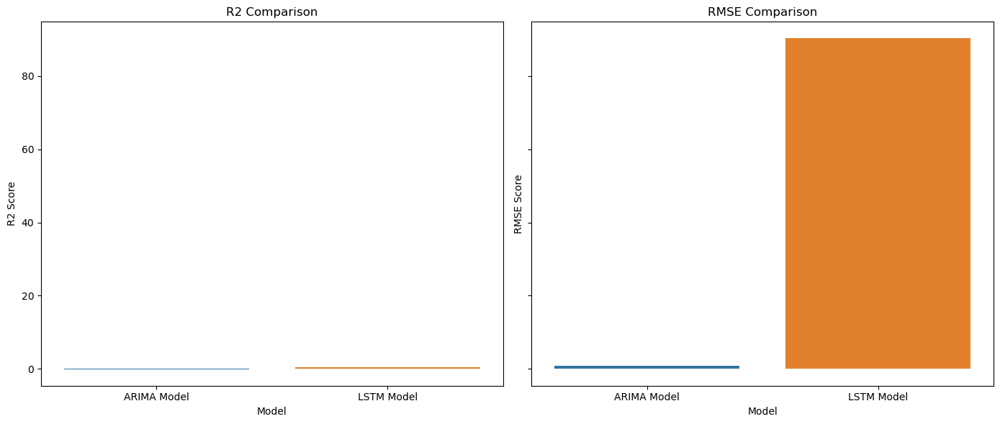

In [229]:
# Prepare the data for plotting
data = {
    'Metric': ['R2', 'R2', 'RMSE', 'RMSE'],
    'Value': [
        arima_r2, lstm_r2, 
        arima_rmse, lstm_rmse
    ], 
    'Model': ['ARIMA Model', 'LSTM Model', 'ARIMA Model', 'LSTM Model']
}

df = pd.DataFrame(data)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)  # Share y-axis scale

# Plot R2
sns.barplot(x='Model', y='Value', data=df[df['Metric'] == 'R2'], ax=axes[0])
axes[0].set_title('R2 Comparison')
axes[0].set_ylabel('R2 Score')
axes[0].set_xlabel('Model')

# Plot RMSE
sns.barplot(x='Model', y='Value', data=df[df['Metric'] == 'RMSE'], ax=axes[1])
axes[1].set_title('RMSE Comparison')
axes[1].set_ylabel('RMSE Score')
axes[1].set_xlabel('Model')

# Adjust layout and display plot
plt.tight_layout()
plt.show()

Based on the provided metrics, neither model performs ideally, yet the **ARIMA model** outperforms the LSTM. Despite its R² score being nearly zero, indicating limited explanatory power, the ARIMA model's lower RMSE suggests it makes smaller average prediction errors.

Therefore, between these options, I recommend the ARIMA model for predicting household appliance energy consumption due to its relatively lower prediction error. Further parameter tuning of the ARIMA model or exploring other predictive models should be considered to achieve more accurate forecasts.

### 7. Reflect on what you have learned by completing this assignment

In time series forecasting models, Principal Component Analysis (PCA) can effectively help with data dimensionality reduction, but determining how to reasonably select parameters to maximize the model's prediction accuracy is a challenge. This includes how to reasonably define the train period and other considerations.

### 8. References

#### Lib references:
1. sklearn
2. numpy
3. pandas
4. matplotlib
5. seaborn as sns
6. statsmodels
7. sklearn
8. torch
9. pmdarima
10. datetime

#### File references:
1. ARIMA & LSTM model: Workshop7.ipynb 
2. Data standard scale methods: House-price-prediction-ridge-lasso-regression Solutions.ipynb
3. Encoding & Normalizing : Income_Evalutation-1.ipynb
4. Train/Test spliting: Workshop Week 4 Solutions.ipynb